<p style="font-size: 40px; font-weight: bold; text-align: center;">
  Galaxies Clustering Project 
</p>

## Dataset
**Data source:** [Galaxy Zoo 2 | Kaggle](https://www.kaggle.com/datasets/jaimetrickz/galaxy-zoo-2-images)
- dataset contains 243k images of galaxies


## Business goal
Automatic Classification of Galaxies
- Automate the process of classifying galaxies 
- Reduce the time and effort required to classify galaxies



### Importing the libraries

In [30]:
import cv2 as cv
from PIL import Image

import os
import sys

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

sys.path.insert(0, os.path.abspath(os.path.join("..", "src")))
from utils import find_extensions, read_filenames, show_galaxies
from processing import load_image

In [2]:
#path = '/Users/michal/Documents/studia/sem4/WdUM/Galaxies_Clusterization/data/images'
path = '/Users/julia/Desktop/semestr-4/ml/projekty/projekt-2/repo_2/Galaxies-Clusterization/data/images'
os.chdir(path)

In [3]:
extensions = find_extensions(path)
print(extensions.keys())

dict_keys(['.jpg', '', '.txt', '.h5'])


In [4]:
print(extensions['.txt'], extensions[''])

['results', 'results_public'] ['z']


In [5]:
!wc -l results.txt
!wc -l results_public.txt

   59979 results.txt
   19992 results_public.txt


In [6]:
galaxies = read_filenames(path)

In [7]:
print(galaxies[:10])

['9733.jpg', '110369.jpg', '14147.jpg', '86425.jpg', '52112.jpg', '108526.jpg', '222363.jpg', '139923.jpg', '89716.jpg', '63.jpg']


In [8]:
heights = set()
widths = set()

for galaxy in galaxies:
    with Image.open(galaxy) as img:
        width, height = img.size
        heights.add(height)
        widths.add(width)

print(f'Heights: {heights}')
print(f'Widths: {widths}')

Heights: {424}
Widths: {424}


All images have the same size: 424 x 424

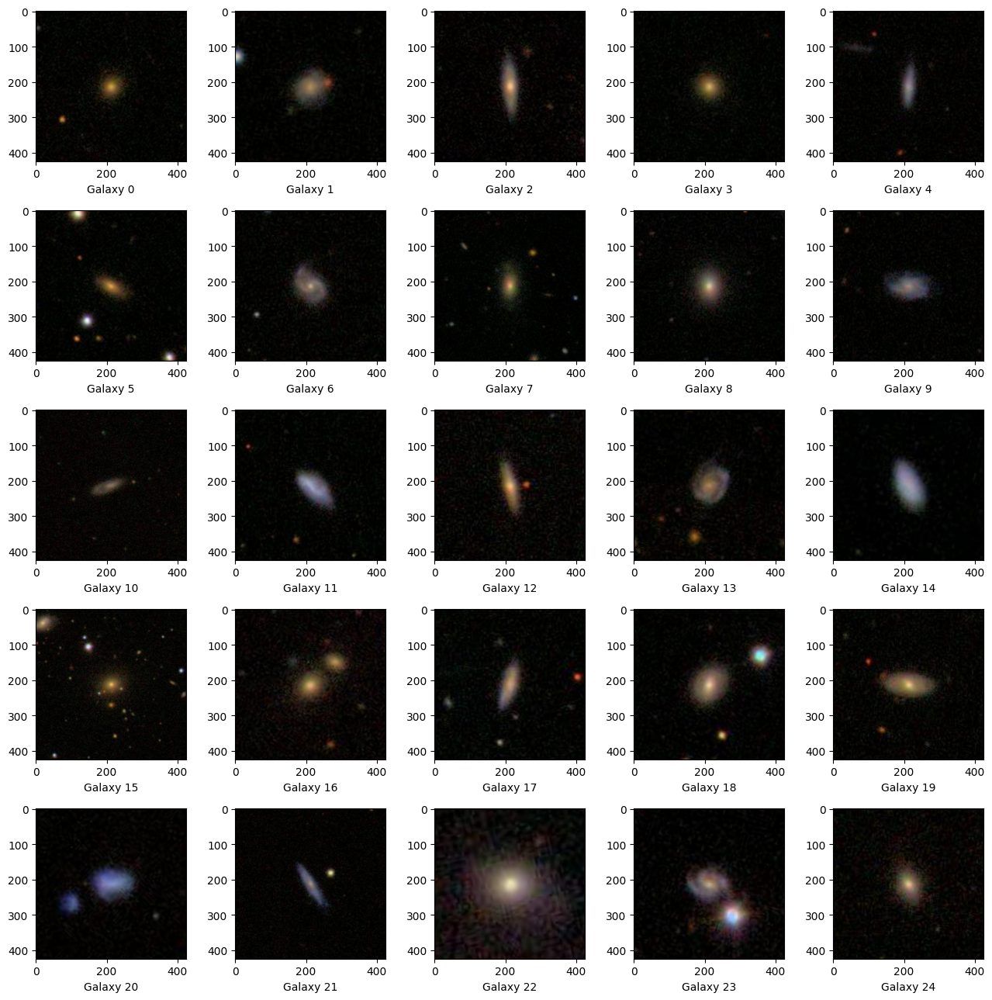

In [8]:
show_galaxies(galaxies) # Set rand = True to explore random galaxies

Galaxies are located in the center of the image, so we will cut them.
(Later another, more clever approach to cutting will be taken - see processing notebook)

In [9]:
def show_galaxy(ind, cut = True):
    if isinstance(ind, int):
        ind = galaxies[ind]
    elif not isinstance(ind, str):
        raise TypeError()    

    img = plt.imread(ind)
    if cut:
        img = img[110:310,110:310]
    plt.xlabel(f'Galaxy {ind}')
    plt.imshow(img)

Before cutting

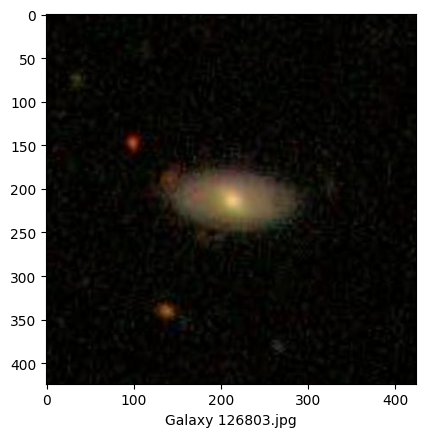

In [10]:
show_galaxy(19, False)

After cutting

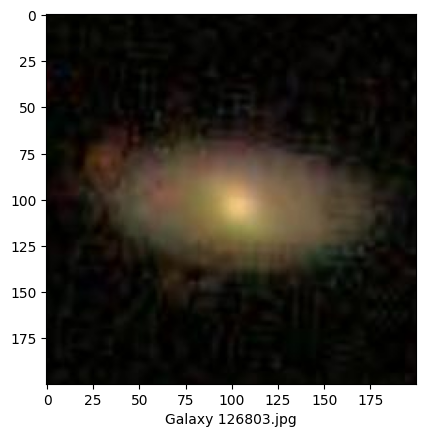

In [11]:
show_galaxy(19)

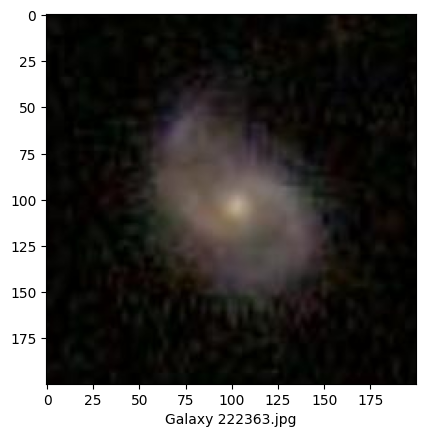

In [12]:
show_galaxy(6)

### Potential outliers

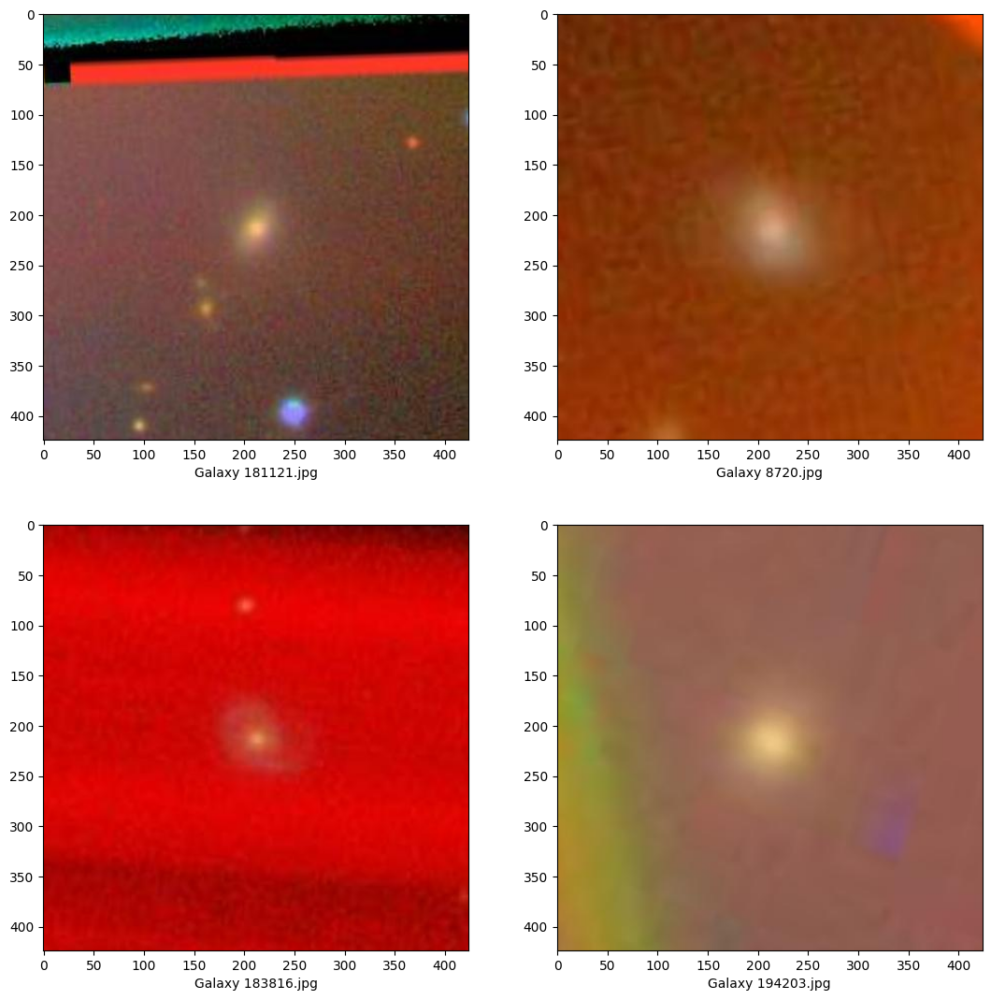

In [13]:
outliers = ['181121.jpg', '8720.jpg', '183816.jpg', '194203.jpg']

figure, axes = plt.subplots(nrows=2,ncols=2,figsize=(13,13))
for i, ax in enumerate(axes.flat):
    img = plt.imread(outliers[i])
    ax.imshow(img)
    ax.set_xlabel(f'Galaxy {outliers[i]}')

### Brightness and color analysis

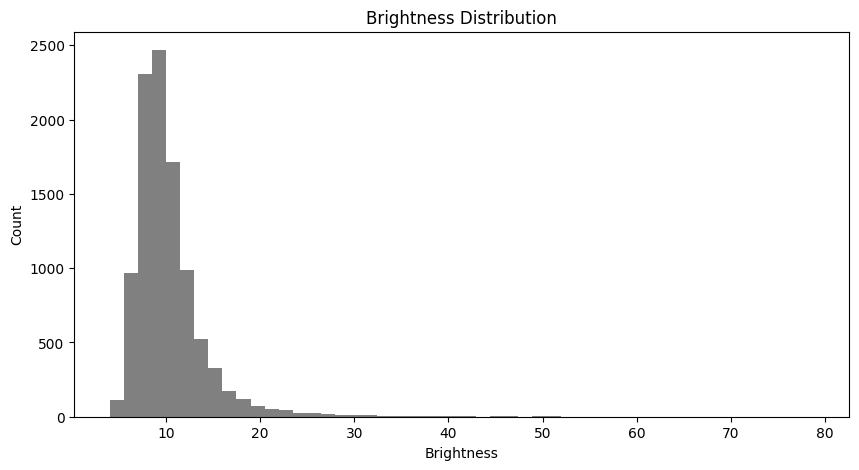

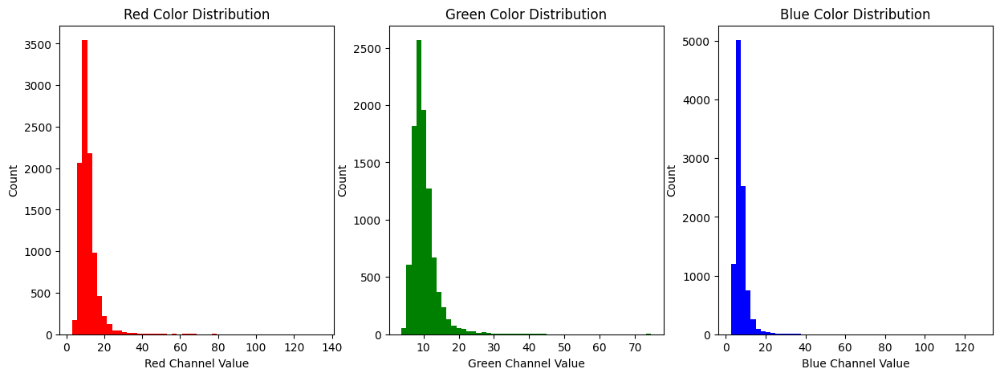

In [25]:
# Function to read images from the directory using the list of file names
def load_galaxies(file_names, max_images=10000):
    images = []
    for i, file_name in enumerate(file_names):
        if i < max_images:
            image = cv.imread(file_name)
            if image is not None:
                images.append((file_name, image))  # Store filename with the image
    return images


# Function to calculate brightness of an image
def calculate_brightness(image):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    return np.mean(gray_image)

# Function to extract color features
def extract_color_features(image):
    mean_color = cv.mean(image)[:3]  # Mean color in BGR format
    return mean_color

images = load_galaxies(galaxies)
brightness_values = [calculate_brightness(galaxy_image[1]) for galaxy_image in images]
color_features = np.array([extract_color_features(galaxy_image[1]) for galaxy_image in images])

# Plot brightness distribution
plt.figure(figsize=(10, 5))
plt.hist(brightness_values, bins=50, color='gray')
plt.title('Brightness Distribution')
plt.xlabel('Brightness')
plt.ylabel('Count')
plt.show()

# Plot color distributions
plt.figure(figsize=(15, 5))

# Red channel
plt.subplot(1, 3, 1)
plt.hist(color_features[:, 2], bins=50, color='red')
plt.title('Red Color Distribution')
plt.xlabel('Red Channel Value')
plt.ylabel('Count')

# Green channel
plt.subplot(1, 3, 2)
plt.hist(color_features[:, 1], bins=50, color='green')
plt.title('Green Color Distribution')
plt.xlabel('Green Channel Value')
plt.ylabel('Count')

# Blue channel
plt.subplot(1, 3, 3)
plt.hist(color_features[:, 0], bins=50, color='blue')
plt.title('Blue Color Distribution')
plt.xlabel('Blue Channel Value')
plt.ylabel('Count')

plt.show()

In [26]:
red_intensities = color_features[:, 2]  
most_red_indices = np.argsort(red_intensities)[::-1] 
most_red_filenames = [images[i][0] for i in most_red_indices]

print("Most red images:")
for filename in most_red_filenames:
    print(filename)

Most red images:
237785.jpg
207281.jpg
102355.jpg
226139.jpg
97716.jpg
112754.jpg
65344.jpg
220825.jpg
255707.jpg
129489.jpg
40462.jpg
140417.jpg
290498.jpg
152199.jpg
82290.jpg
100966.jpg
44374.jpg
82482.jpg
136230.jpg
261528.jpg
70953.jpg
65191.jpg
138220.jpg
206376.jpg
40258.jpg
207901.jpg
263897.jpg
149142.jpg
101728.jpg
42063.jpg
290894.jpg
34644.jpg
270544.jpg
21739.jpg
209722.jpg
288822.jpg
102396.jpg
235838.jpg
61309.jpg
148880.jpg
137488.jpg
39176.jpg
46589.jpg
232987.jpg
102023.jpg
188904.jpg
244569.jpg
91617.jpg
60163.jpg
105599.jpg
35823.jpg
144664.jpg
186055.jpg
61484.jpg
243415.jpg
116240.jpg
206772.jpg
213975.jpg
131199.jpg
129259.jpg
125885.jpg
942.jpg
272597.jpg
169682.jpg
34679.jpg
211232.jpg
154649.jpg
176172.jpg
215134.jpg
228100.jpg
253559.jpg
93014.jpg
125265.jpg
99920.jpg
64932.jpg
94753.jpg
70239.jpg
49042.jpg
58167.jpg
140204.jpg
9109.jpg
46832.jpg
112422.jpg
42103.jpg
126553.jpg
106495.jpg
176173.jpg
84583.jpg
227352.jpg
77033.jpg
113926.jpg
263101.jpg
185400.

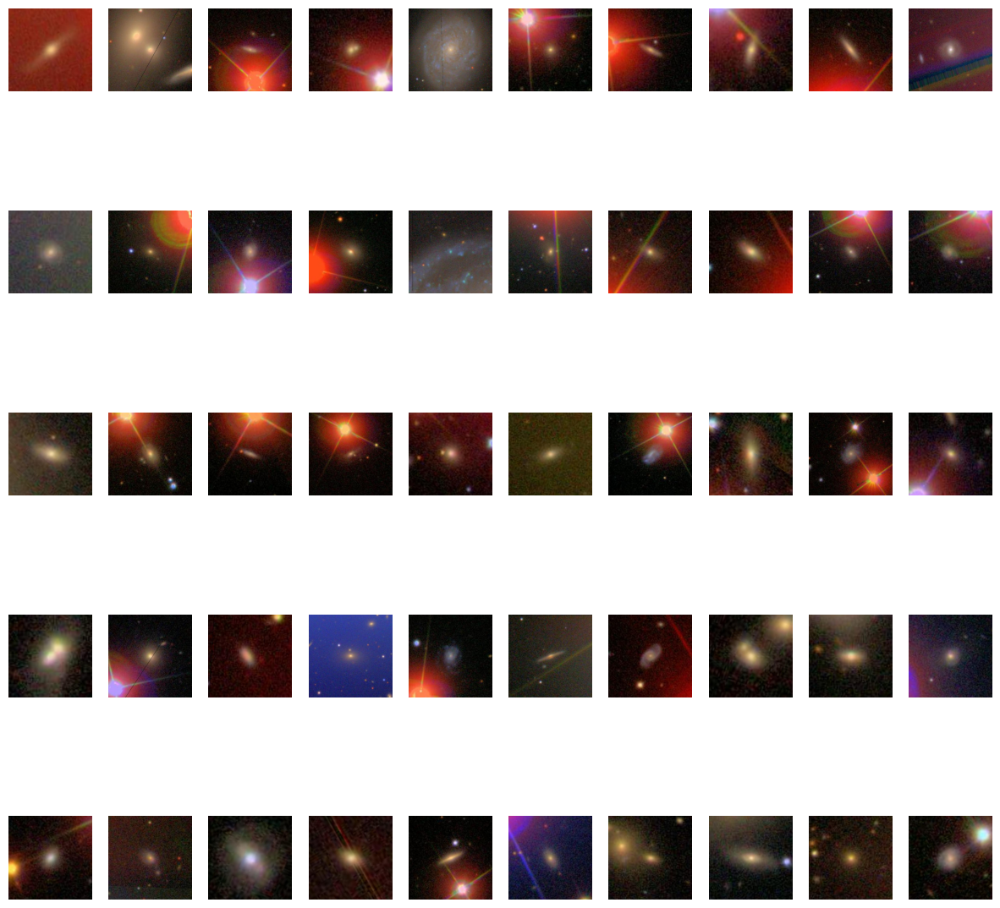

In [34]:
# load 50 most red images

most_red_images = [cv.imread(filename) for filename in most_red_filenames[:50]]

# plot 50 most red images
plt.figure(figsize=(15, 15))
for i, image in enumerate(most_red_images):
    plt.subplot(5, 10, i + 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis('off')

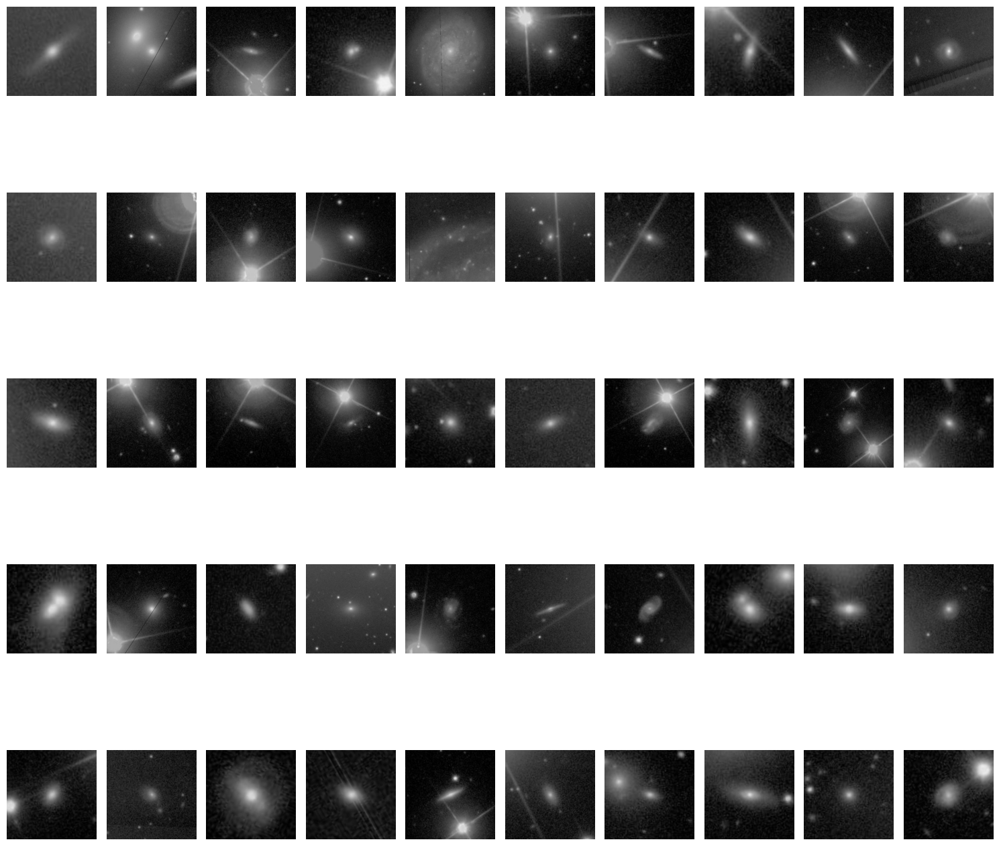

In [35]:
most_red_images_gray = [cv.cvtColor(image, cv.COLOR_BGR2GRAY) for image in most_red_images]
most_red_images_gray_rgb = [cv.cvtColor(image, cv.COLOR_GRAY2RGB) for image in most_red_images_gray]

# Wyświetlanie 50 najbardziej czerwonych obrazów w skali szarości
plt.figure(figsize=(15, 15))
for i, image in enumerate(most_red_images_gray_rgb):
    plt.subplot(5, 10, i + 1)
    plt.imshow(image)
    plt.axis('off')

plt.tight_layout()
plt.show()

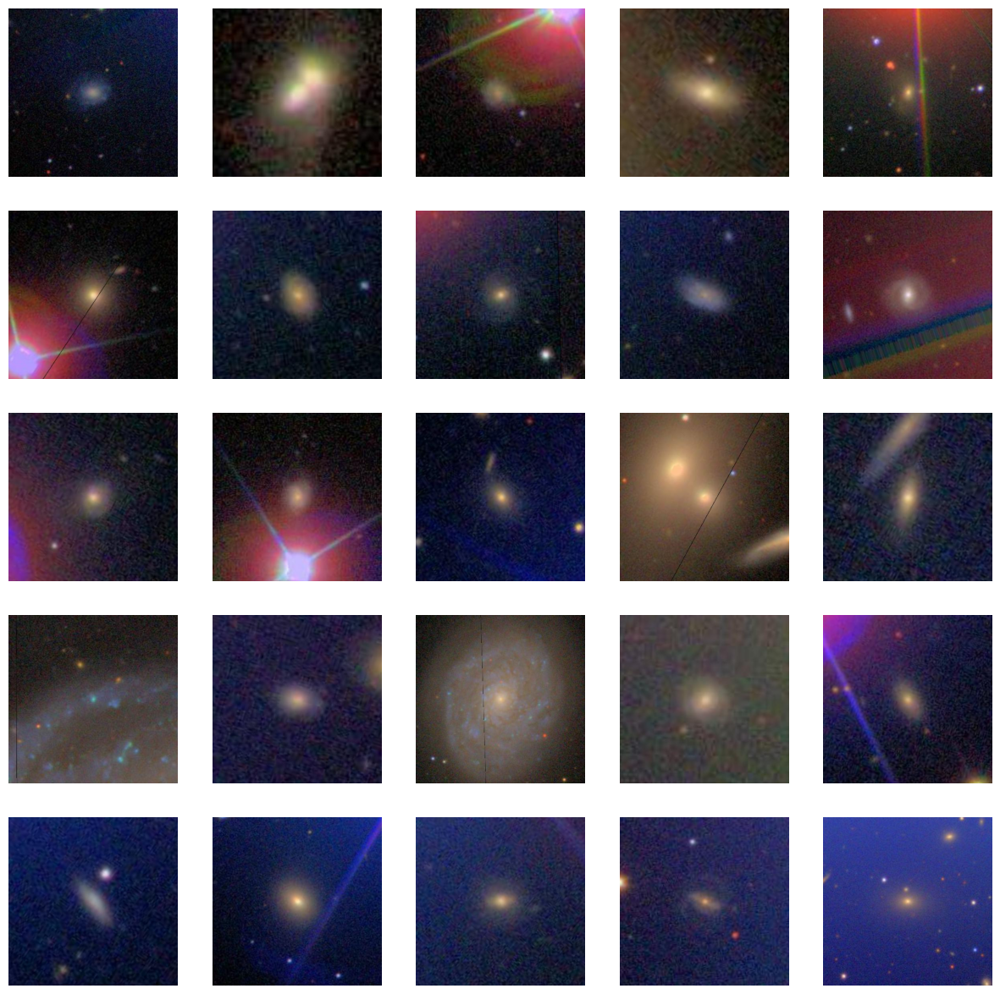

In [24]:
# 25 bluest images
bluest_images = np.argsort(color_features[:, 0])[-25:]

plt.figure(figsize=(15, 15))
for i, image_index in enumerate(bluest_images):
    plt.subplot(5, 5, i + 1)
    plt.imshow(cv.cvtColor(images[image_index], cv.COLOR_BGR2RGB))
    plt.axis('off')

In [36]:
red_intensities = color_features[:, 2]  
most_red_indices = np.argsort(red_intensities)[::-1] 
most_red_filenames = [images[i][0] for i in most_red_indices]

blue_intensities = color_features[:, 0]
most_blue_indices = np.argsort(blue_intensities)[::-1]
most_blue_filenames = [images[i][0] for i in most_blue_indices]

green_intensities = color_features[:, 1]
most_green_indices = np.argsort(green_intensities)[::-1]
most_green_filenames = [images[i][0] for i in most_green_indices]


# print("Most red images:")
# for filename in most_red_filenames:
#     print(filename)

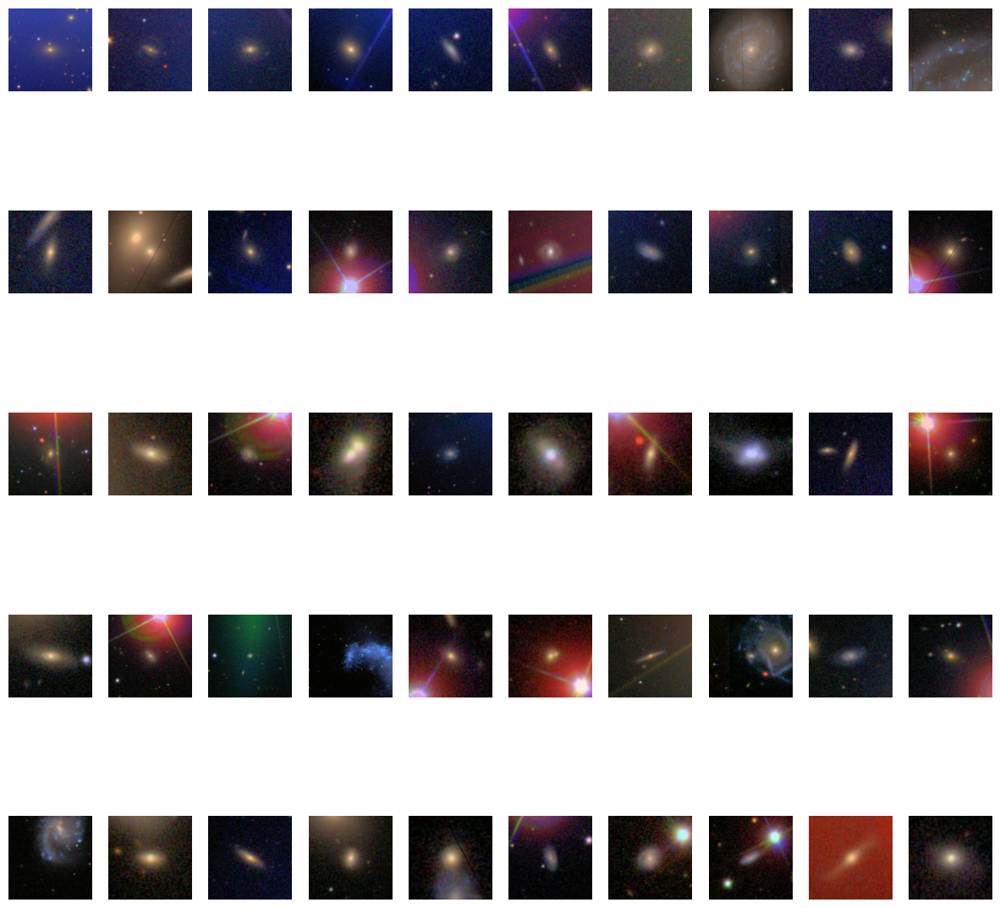

In [37]:
# load 50 most blue images

most_blue_images = [cv.imread(filename) for filename in most_blue_filenames[:50]]

# plot 50 most red images
plt.figure(figsize=(15, 15))
for i, image in enumerate(most_blue_images):
    plt.subplot(5, 10, i + 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis('off')

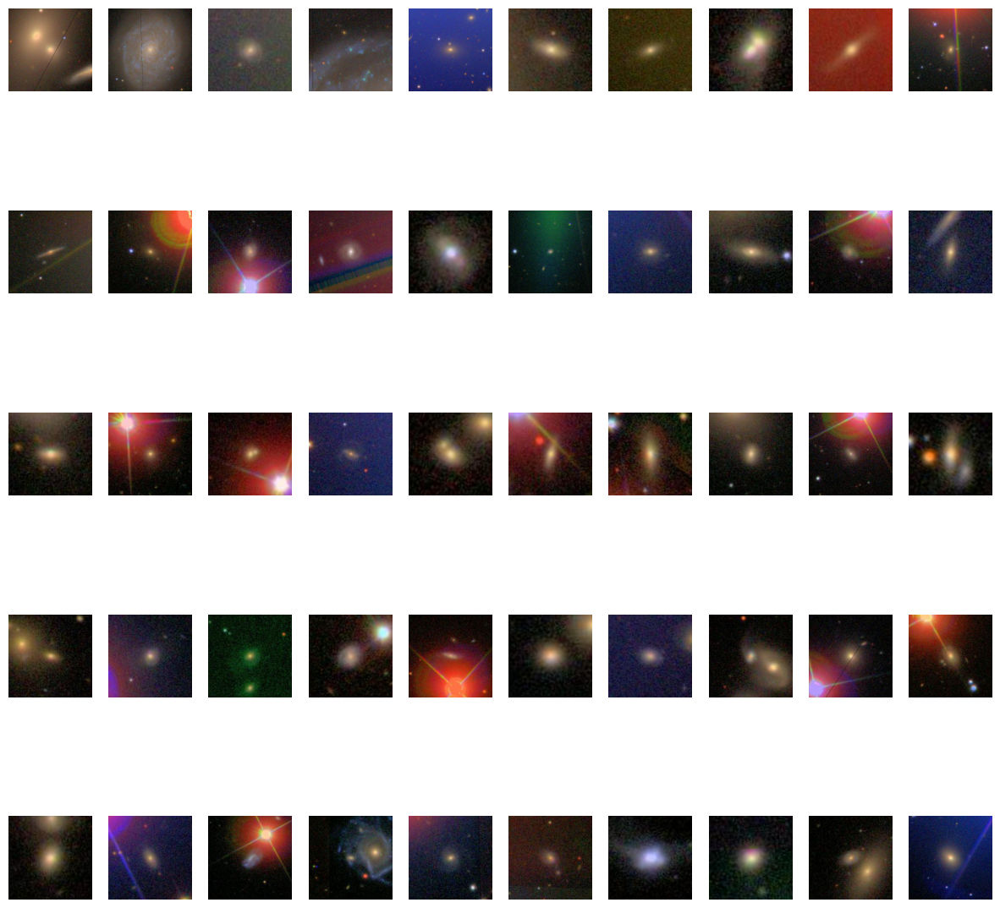

In [38]:
# load 50 most green images

most_green_images = [cv.imread(filename) for filename in most_green_filenames[:50]]

# plot 50 most red images
plt.figure(figsize=(15, 15))
for i, image in enumerate(most_green_images):
    plt.subplot(5, 10, i + 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis('off')

### Binary thresholding

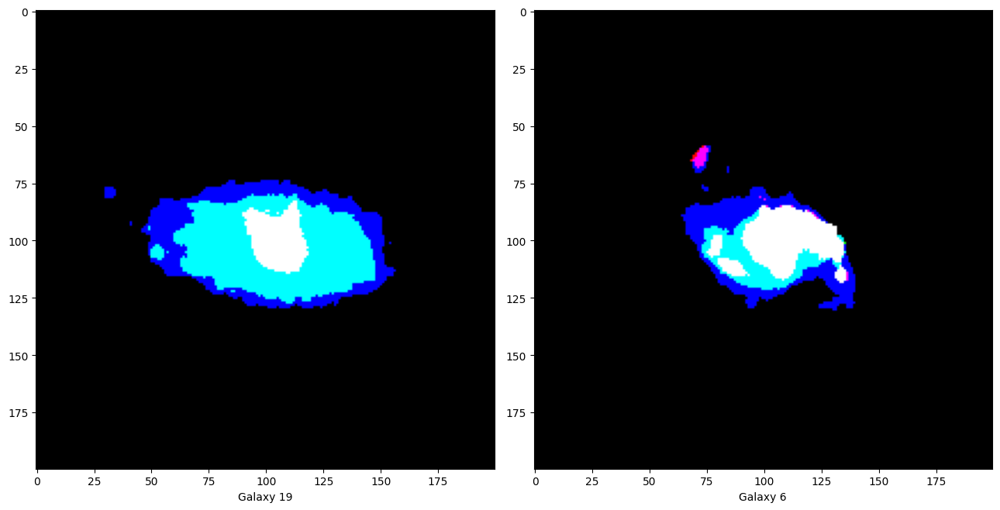

In [63]:
figure, axis = plt.subplots(nrows=1, ncols=2, figsize=(13,13))
indices = (19, 6)

for i, ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    _, Thresh_IMG = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    ax.imshow(Thresh_IMG, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')

plt.tight_layout()
plt.show()

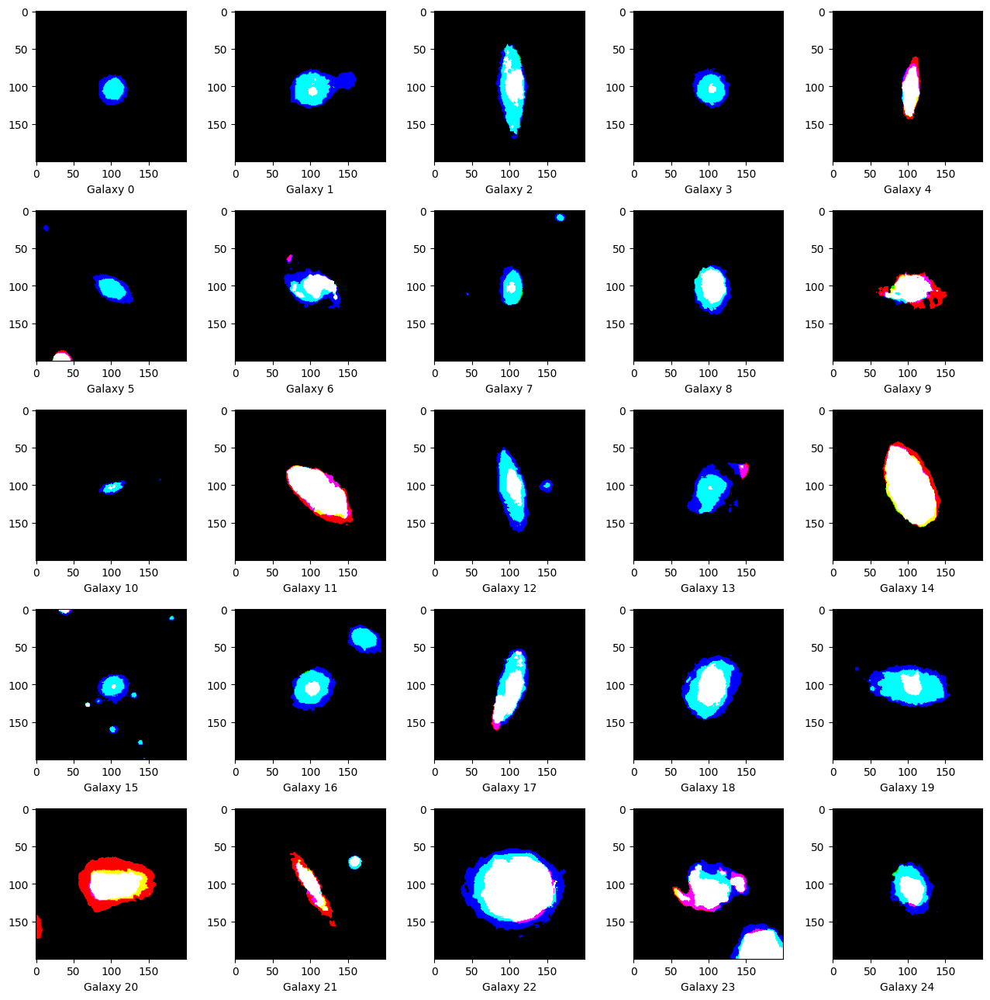

In [80]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    _,Thresh_IMG = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    ax.imshow(Thresh_IMG, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
plt.tight_layout()
plt.show()

### Size of galaxies

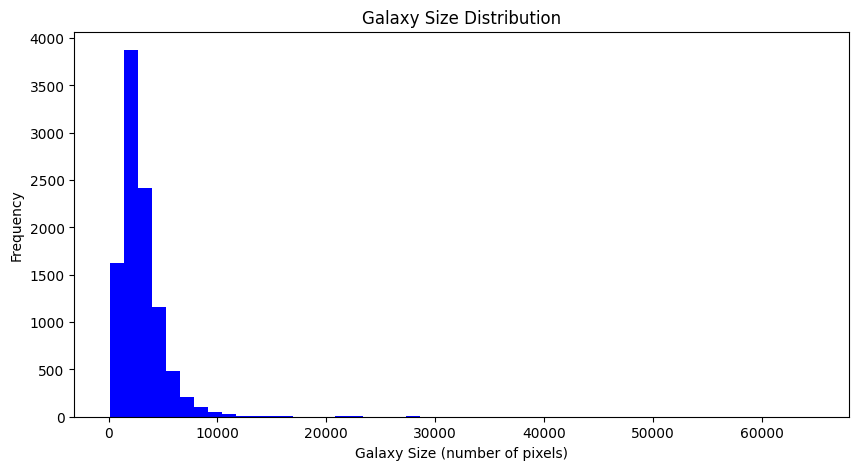

In [8]:
def calculate_galaxy_size(image, threshold=90):
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    _, binary_image = cv.threshold(gray_image, threshold, 255, cv.THRESH_BINARY)
    galaxy_size = cv.countNonZero(binary_image)
    return galaxy_size

galaxy_sizes = [calculate_galaxy_size(galaxy_image) for galaxy_image in images]

# Plot galaxy size distribution
plt.figure(figsize=(10, 5))
plt.hist(galaxy_sizes, bins=50, color='blue')
plt.title('Galaxy Size Distribution')
plt.xlabel('Galaxy Size (number of pixels)')
plt.ylabel('Frequency')
plt.show()

### Contour detection

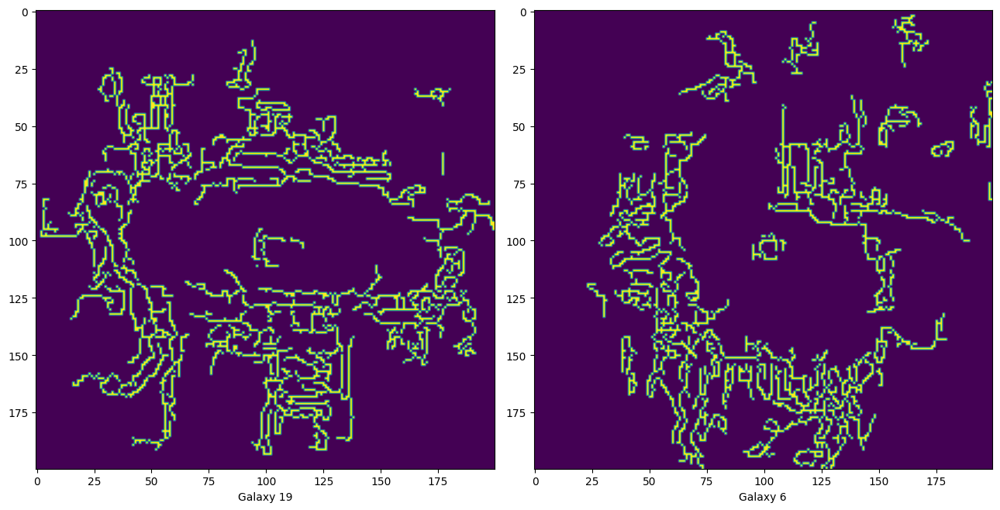

In [70]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i], 0)
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    draw_contour = cv.drawContours(canny_img, contour, -1, (255,0,0), 1)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(draw_contour)
plt.tight_layout()
plt.show()

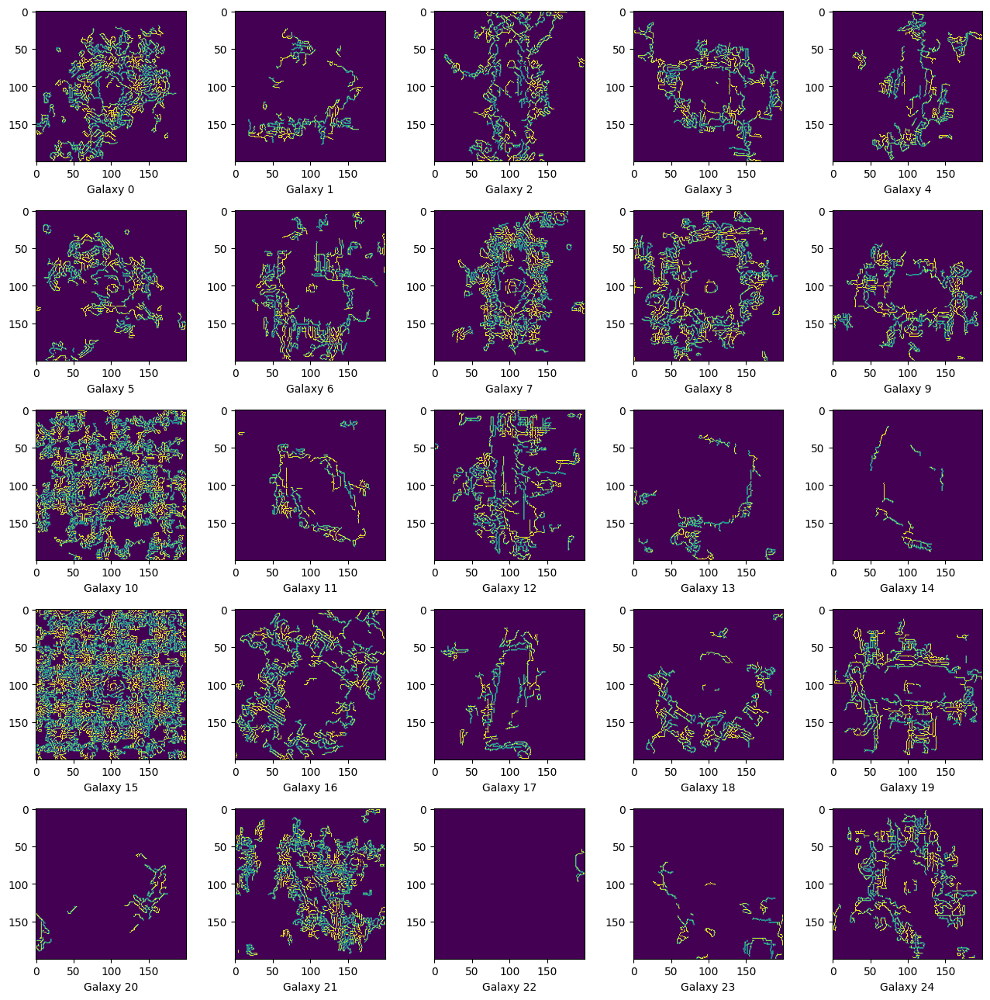

In [69]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i], 0)
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    draw_contour = cv.drawContours(canny_img, contour, -1, (255,0,0), 1)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(draw_contour)
plt.tight_layout()
plt.show()

### Absolute difference

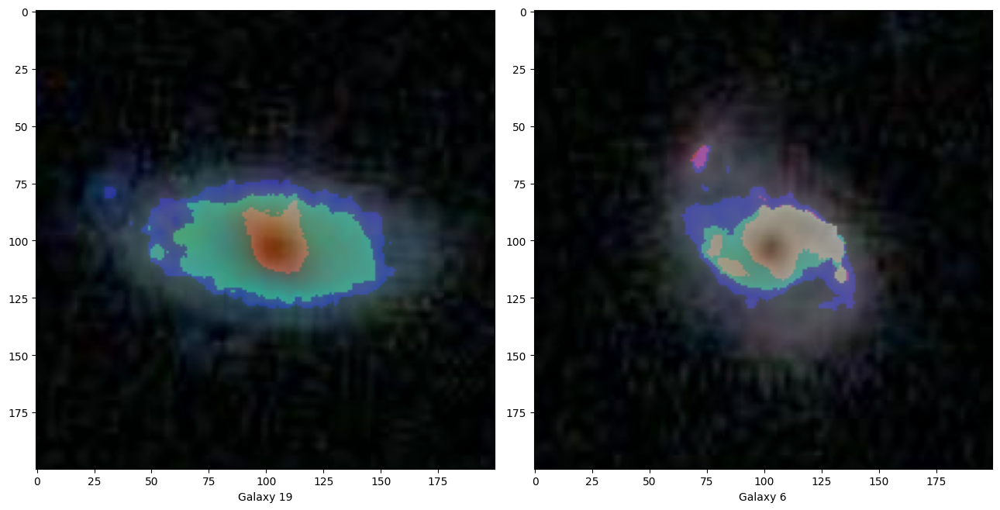

In [72]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    _, thresh_img = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    diff_img = cv.absdiff(cut_img, thresh_img)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(diff_img)
plt.tight_layout()
plt.show()

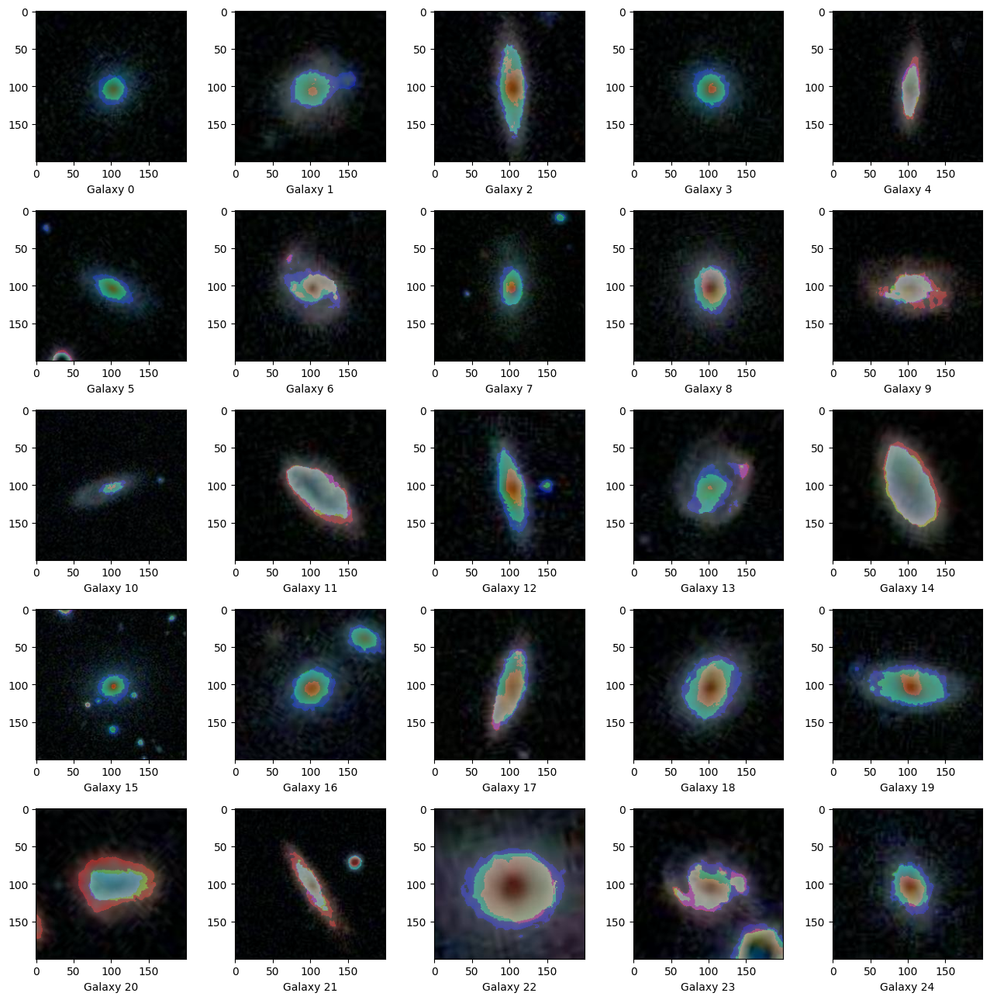

In [73]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    _, thresh_img = cv.threshold(cut_img, 90, 255, cv.THRESH_BINARY)
    diff_img = cv.absdiff(cut_img, thresh_img)
    ax.set_xlabel(f'Galaxy {i}')
    ax.imshow(diff_img)
plt.tight_layout()
plt.show()

### Contour detection (bounding rectangle)

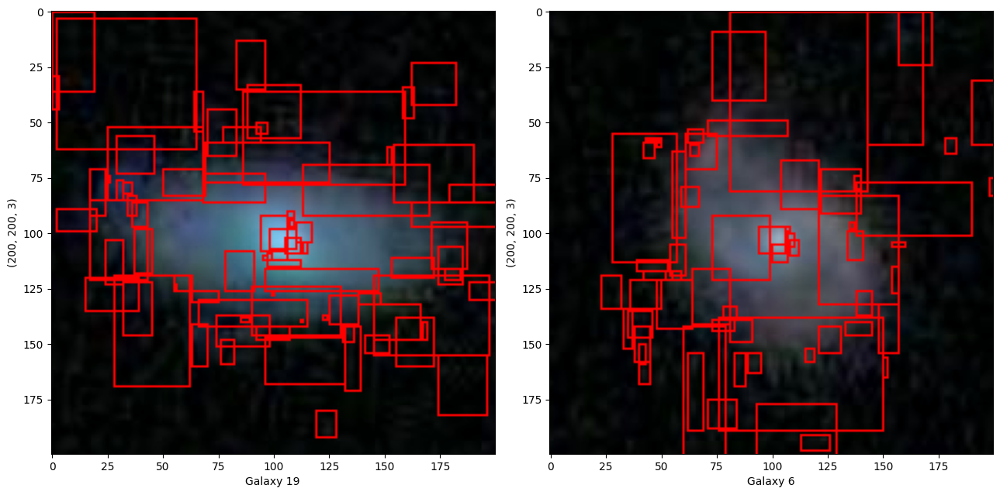

In [79]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(13,13))

for i,ax in zip(indices, axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    for cnt in contour:
        x,y,w,h = cv.boundingRect(cnt)
        cv.rectangle(cut_img,(x,y),(x+w,y+h),(255,0,0),1)
    ax.imshow(cut_img, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
    ax.set_ylabel(cut_img.shape)
plt.tight_layout()
plt.show()

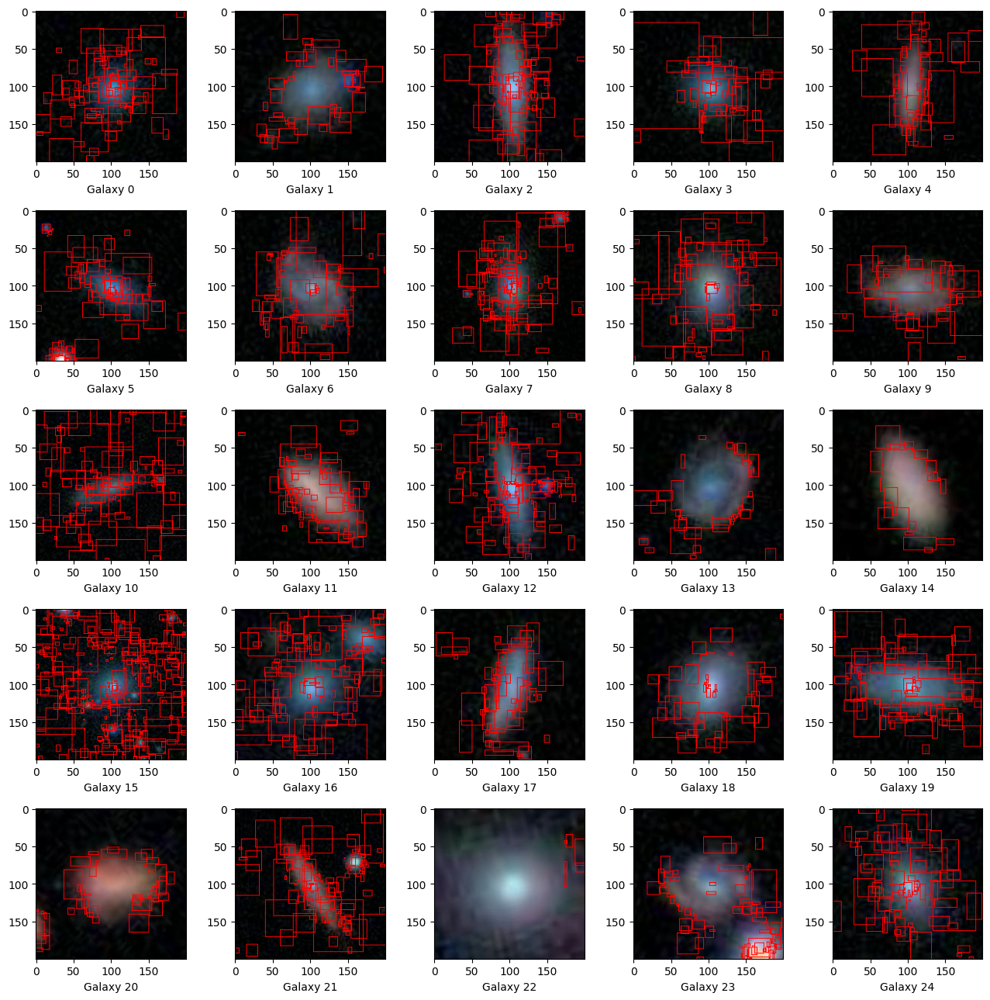

In [78]:
figure,axis = plt.subplots(nrows=5,ncols=5,figsize=(13,13))

for i,ax in enumerate(axis.flat):
    img = cv.imread(galaxies[i])
    cut_img = img[110:310,110:310]
    canny_img = cv.Canny(cut_img, 5, 80)
    contour,_ = cv.findContours(canny_img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    for cnt in contour:
        x,y,w,h = cv.boundingRect(cnt)
        cv.rectangle(cut_img,(x,y),(x+w,y+h),(255,0,0),1)
    ax.imshow(cut_img, cmap='Greys_r')
    ax.set_xlabel(f'Galaxy {i}')
plt.tight_layout()
plt.show()